## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "singer_age_decade_30"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 30


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 100


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6980
Epoch 1 Validation Loss: 0.6971
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


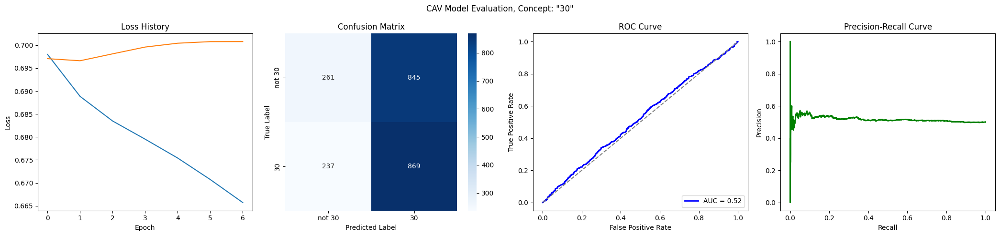

Training run 2/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


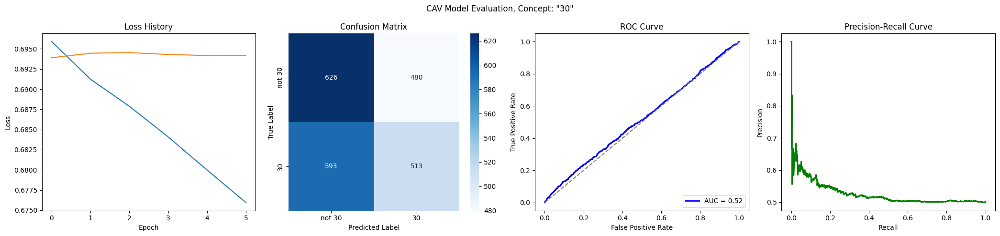

Training run 3/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6564
Epoch 11 Validation Loss: 0.6866
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_30/loss_history.json


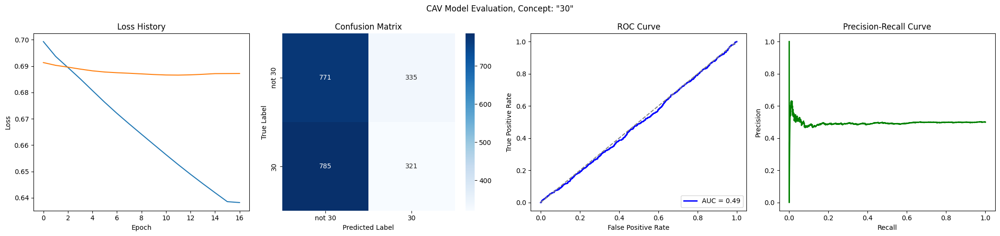

Training run 4/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


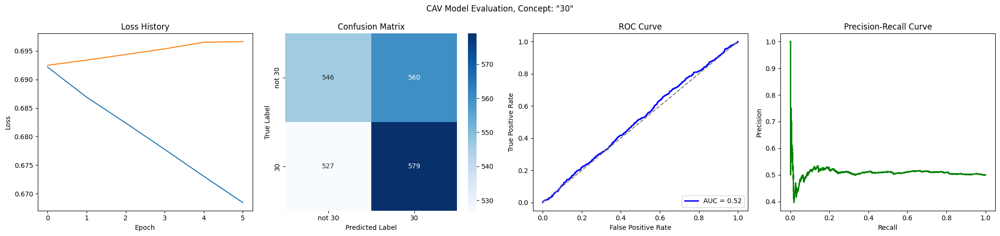

Training run 5/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6881
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6163
Epoch 21 Validation Loss: 0.6876
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_30/loss_history.json


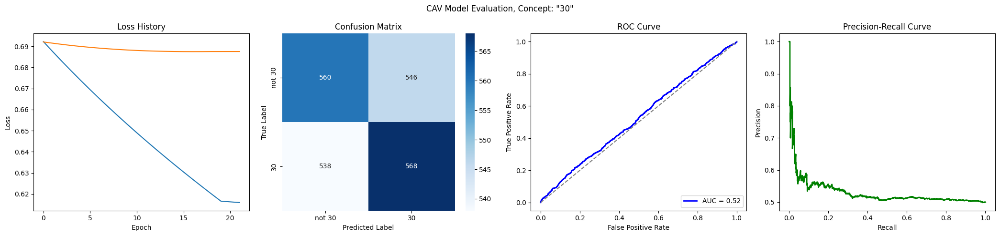

Training run 6/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6502
Epoch 11 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6105
Epoch 21 Validation Loss: 0.6888
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_30/loss_history.json


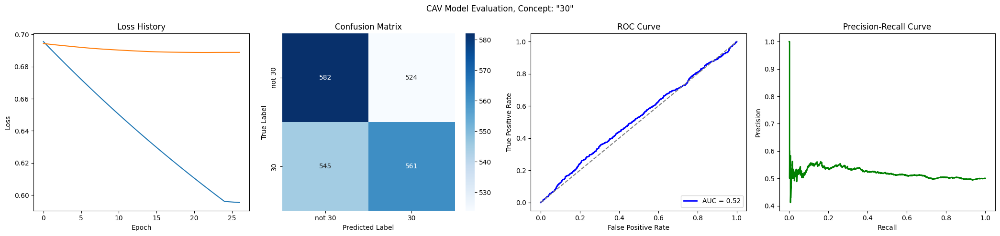

Training run 7/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7033
Epoch 1 Validation Loss: 0.6982
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


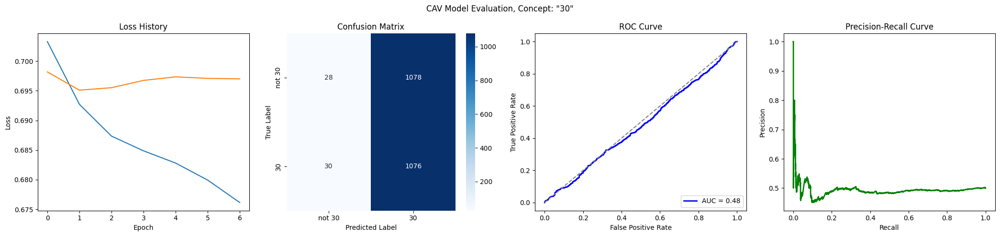

Training run 8/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


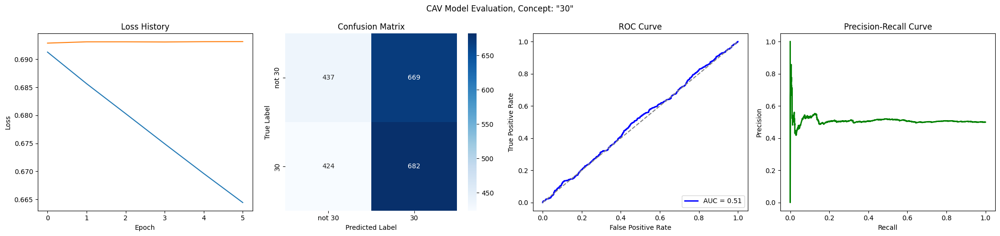

Training run 9/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6894
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


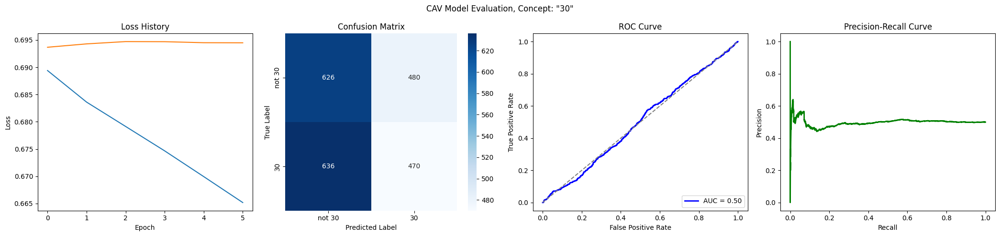

Training run 10/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


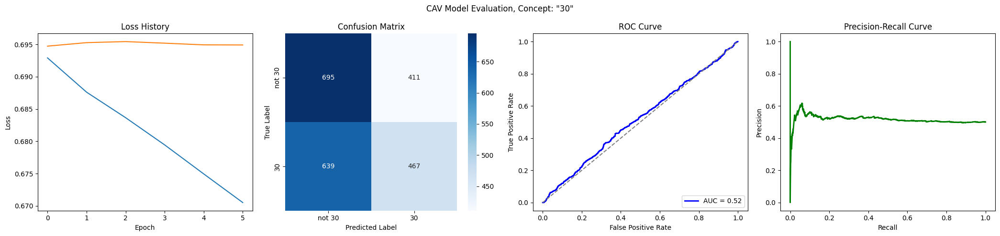

Training run 11/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6526
Epoch 11 Validation Loss: 0.6863
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_30/loss_history.json


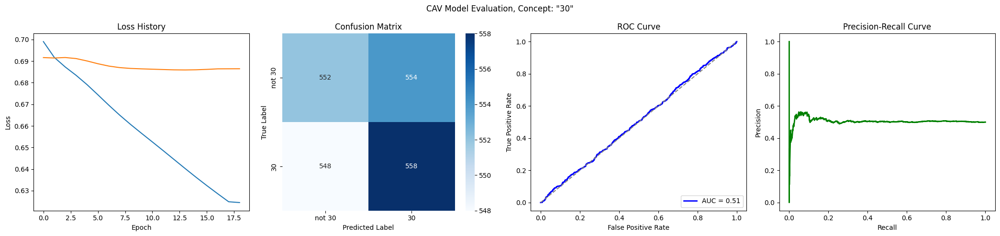

Training run 12/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6528
Epoch 11 Validation Loss: 0.6853
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_30/loss_history.json


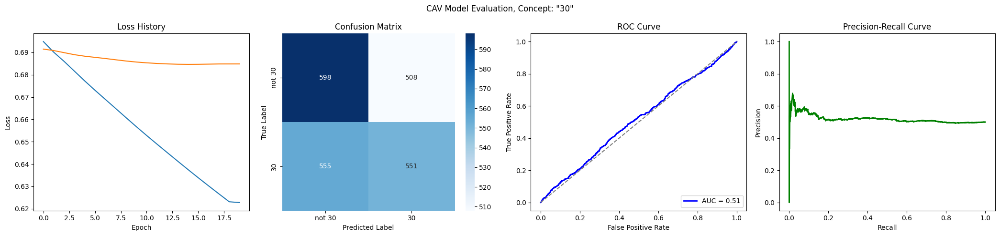

Training run 13/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 10
Loss history saved to trainings/singer_age_decade_30/loss_history.json


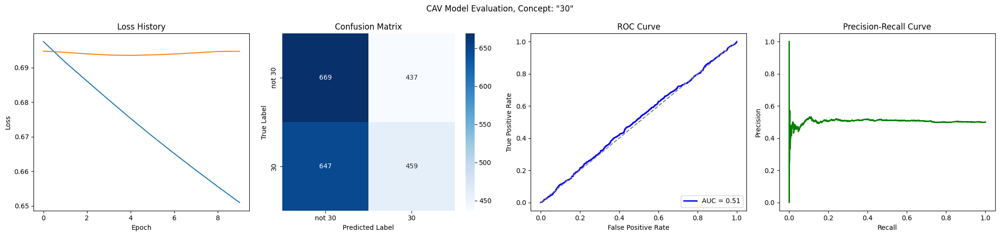

Training run 14/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


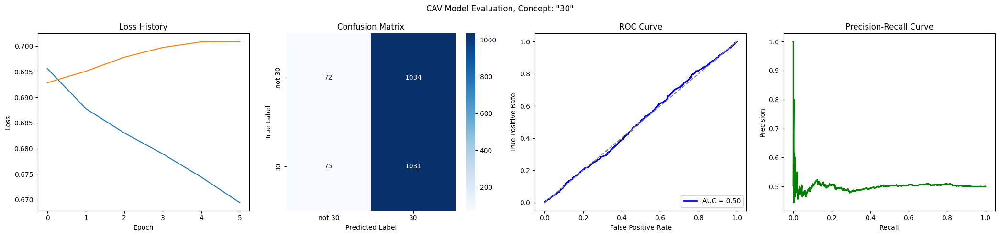

Training run 15/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.7021
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


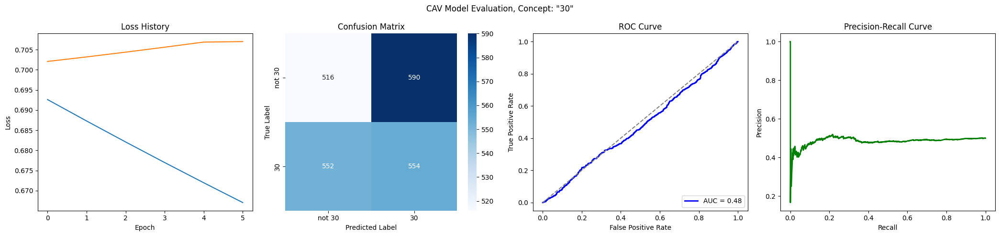

Training run 16/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


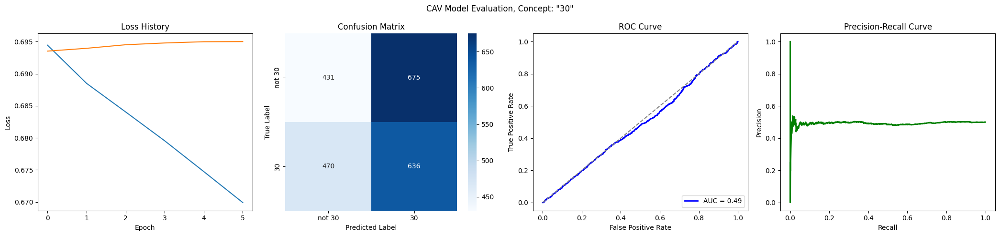

Training run 17/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6976
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6744
Epoch 11 Validation Loss: 0.6969
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6701
Epoch 21 Validation Loss: 0.6962
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6659
Epoch 31 Validation Loss: 0.6959
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6616
Epoch 41 Validation Loss: 0.6957
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.6575
Epoch 51 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.6533
Epoch 61 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

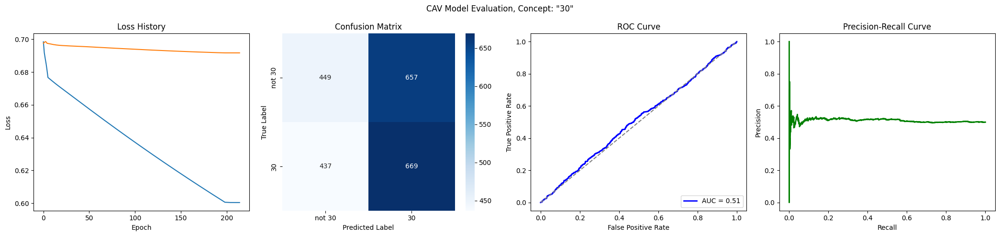

Training run 18/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


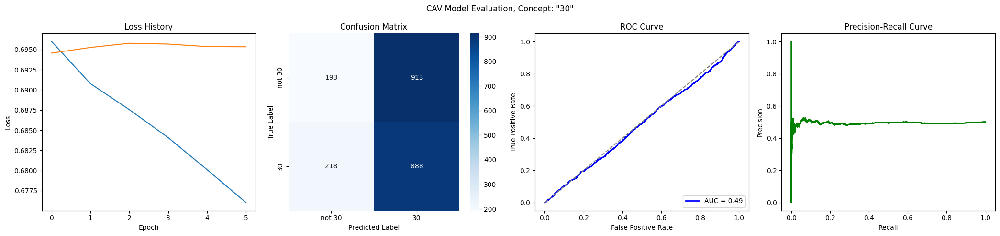

Training run 19/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


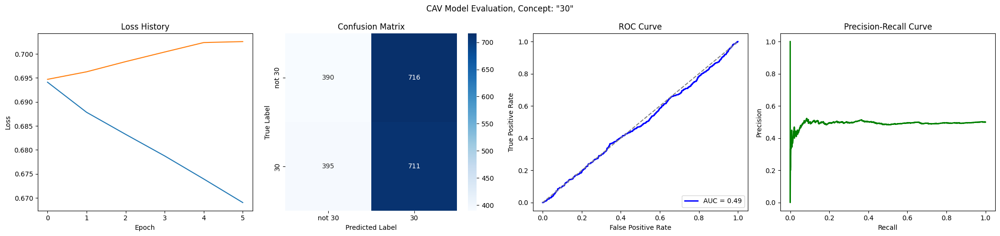

Training run 20/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6980
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


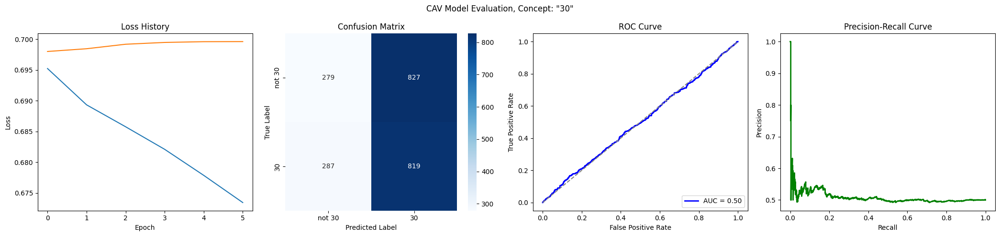

Training run 21/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


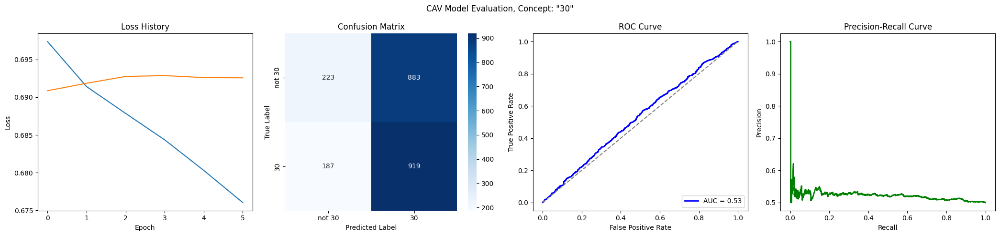

Training run 22/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7000
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


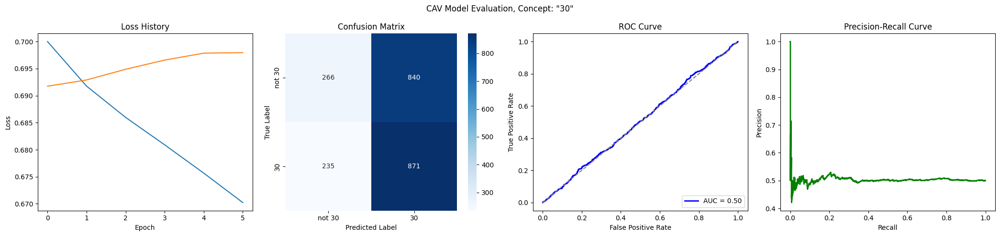

Training run 23/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7009
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


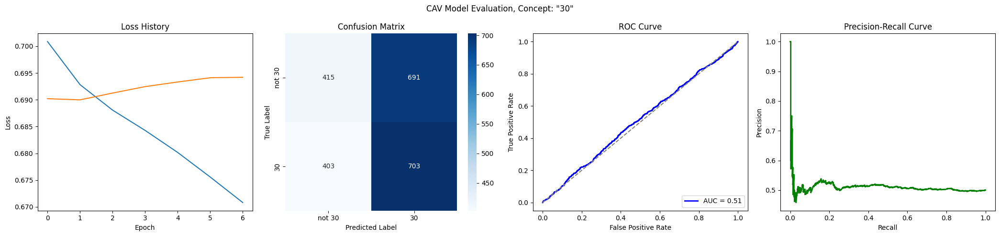

Training run 24/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


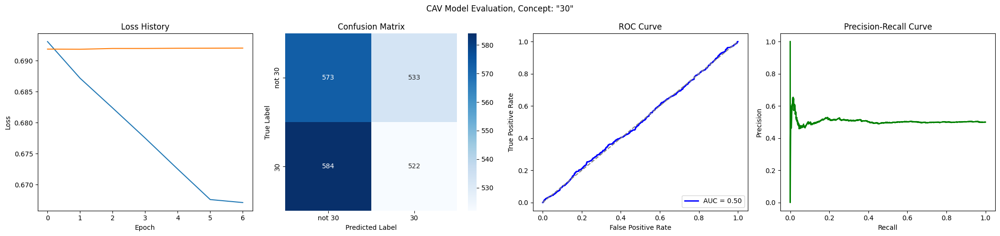

Training run 25/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


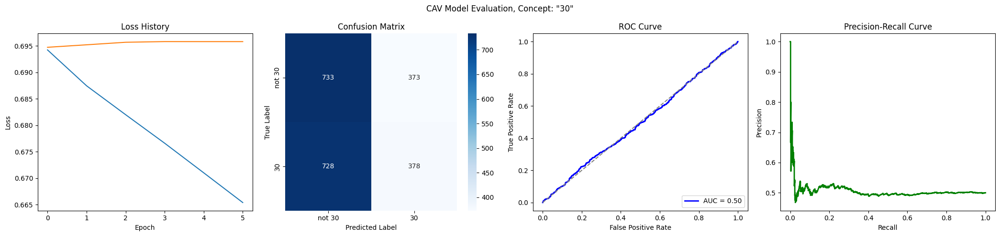

Training run 26/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6509
Epoch 11 Validation Loss: 0.6882
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_30/loss_history.json


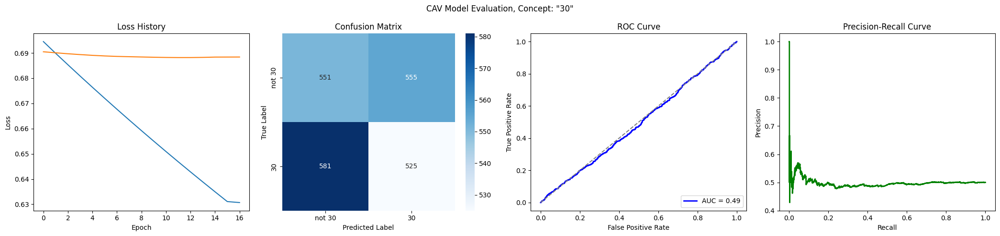

Training run 27/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7038
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6500
Epoch 11 Validation Loss: 0.6825
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6064
Epoch 21 Validation Loss: 0.6795
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_30/loss_history.json


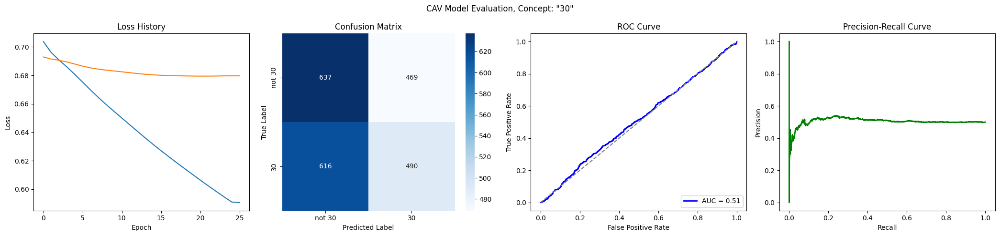

Training run 28/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


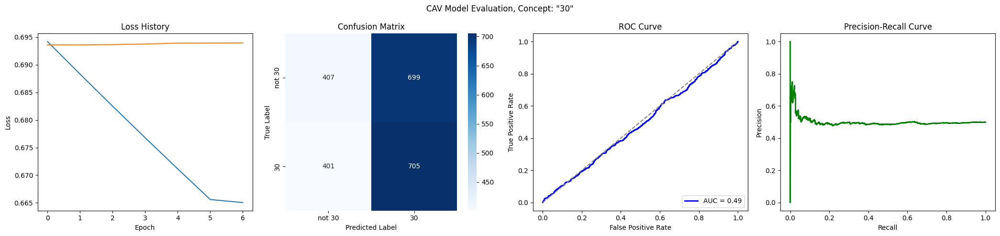

Training run 29/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6504
Epoch 11 Validation Loss: 0.6914
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_30/loss_history.json


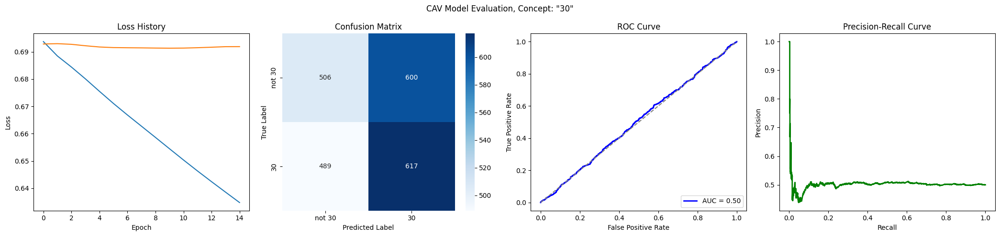

Training run 30/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6438
Epoch 11 Validation Loss: 0.6854
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6006
Epoch 21 Validation Loss: 0.6822
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_30/loss_history.json


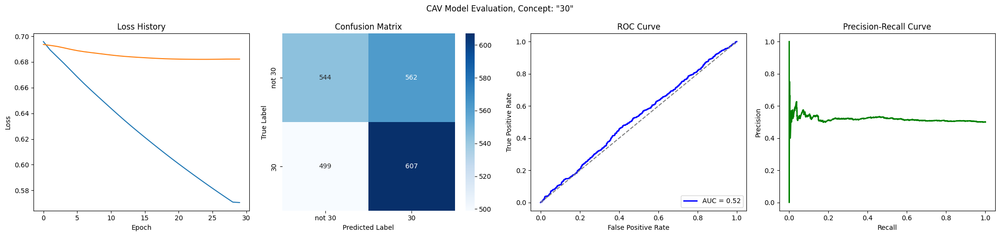

Training run 31/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6983
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


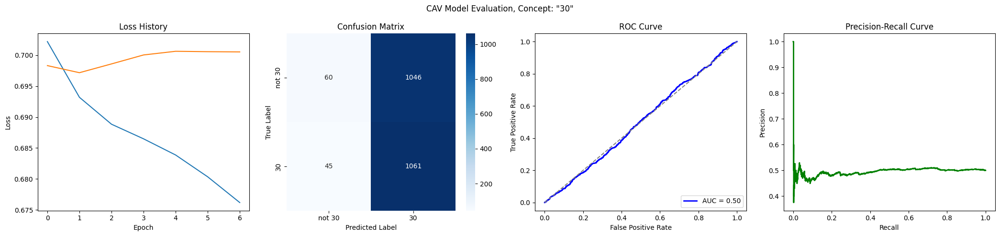

Training run 32/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


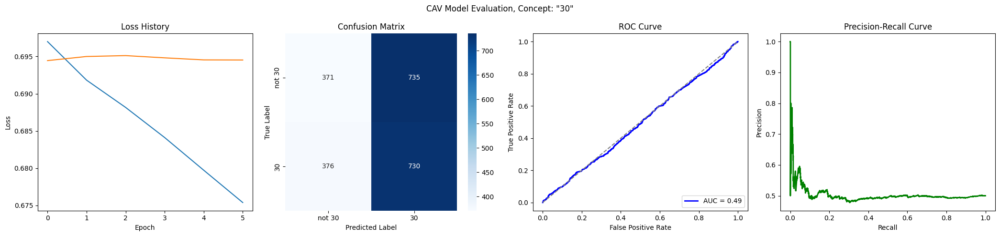

Training run 33/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6495
Epoch 11 Validation Loss: 0.6883
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6110
Epoch 21 Validation Loss: 0.6857
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_30/loss_history.json


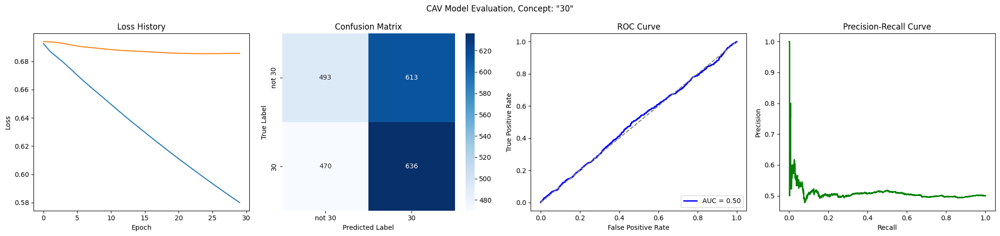

Training run 34/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6961
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


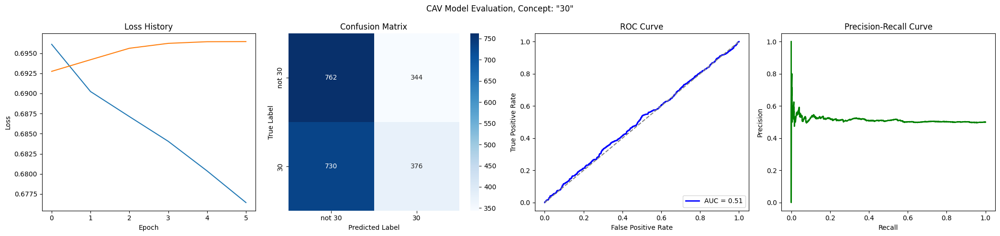

Training run 35/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7025
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


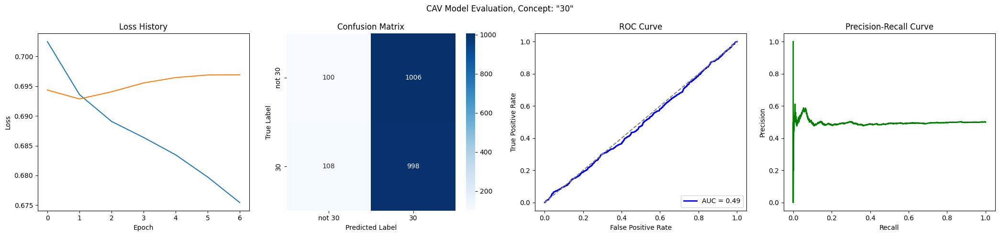

Training run 36/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6385
Epoch 11 Validation Loss: 0.6893
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_30/loss_history.json


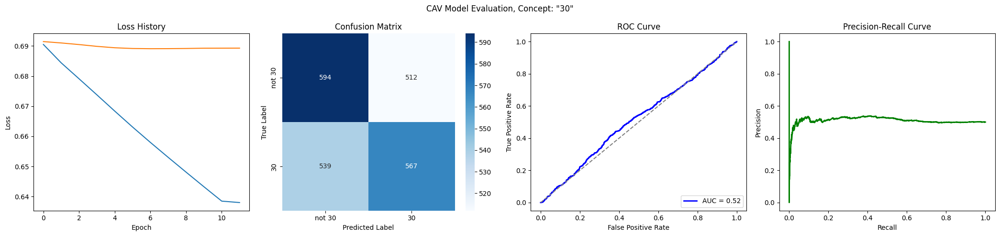

Training run 37/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6963
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6722
Epoch 11 Validation Loss: 0.6963
Early stopping at epoch 13
Loss history saved to trainings/singer_age_decade_30/loss_history.json


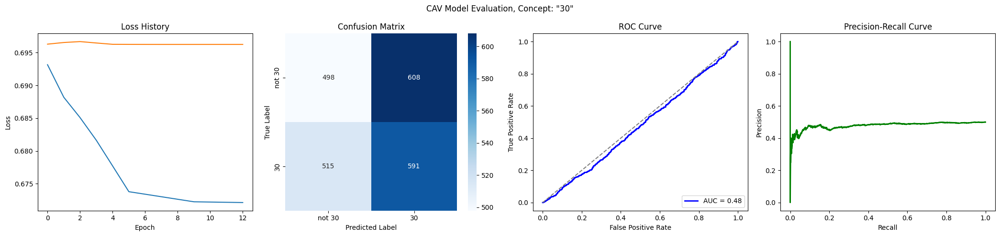

Training run 38/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6963
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6509
Epoch 11 Validation Loss: 0.6908
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_30/loss_history.json


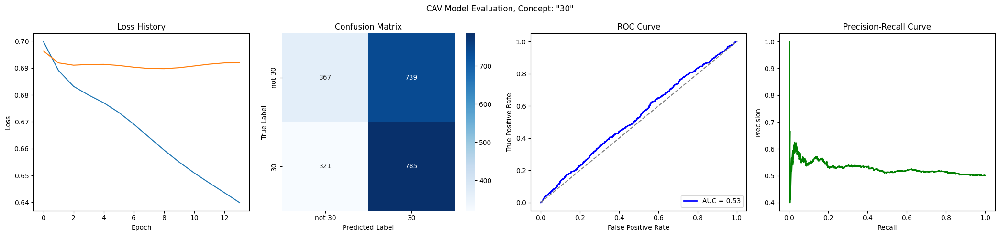

Training run 39/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7044
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


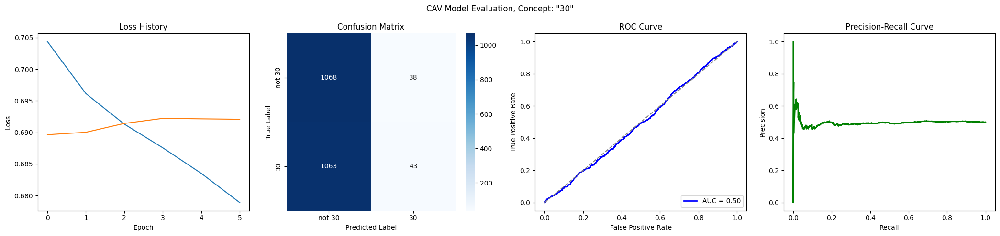

Training run 40/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


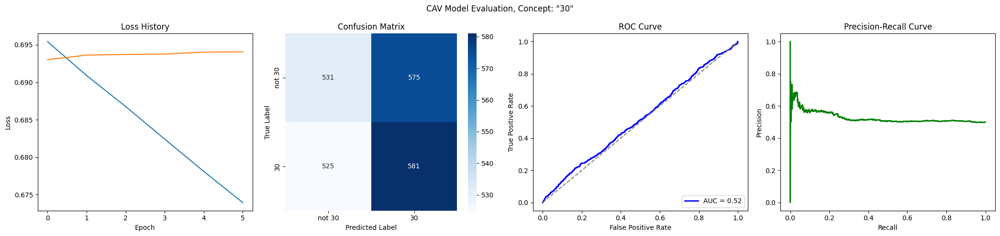

Training run 41/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6915
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_30/loss_history.json


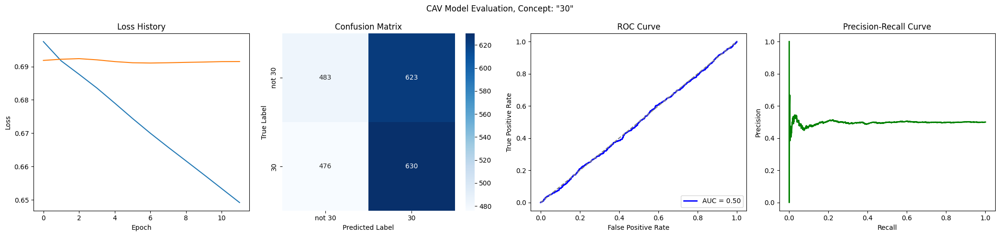

Training run 42/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6972
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


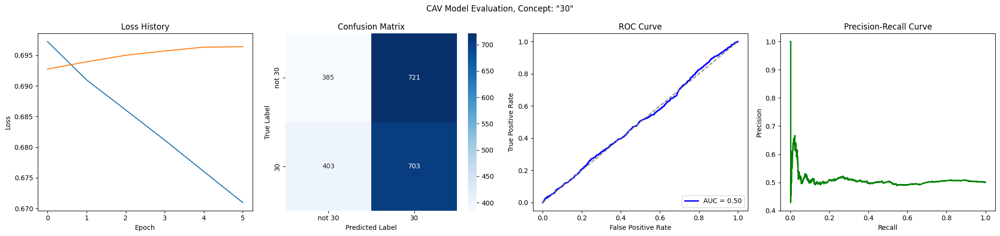

Training run 43/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


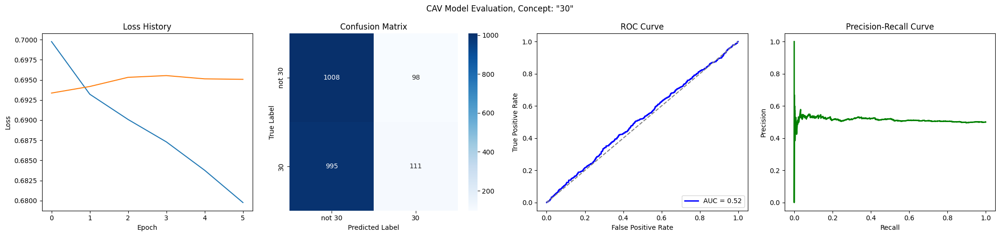

Training run 44/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/singer_age_decade_30/loss_history.json


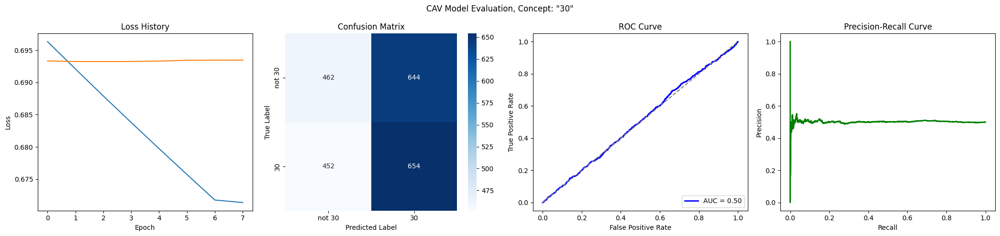

Training run 45/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6511
Epoch 11 Validation Loss: 0.6891
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_30/loss_history.json


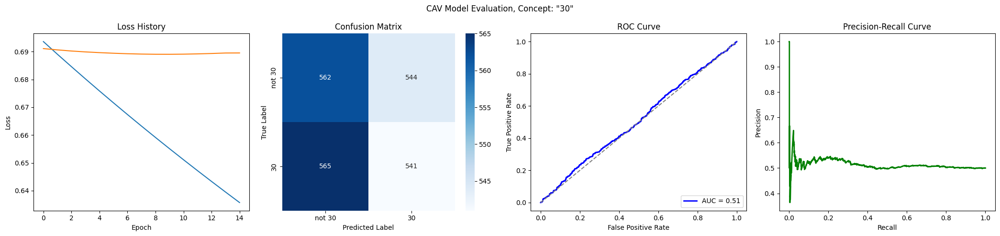

Training run 46/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6968
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


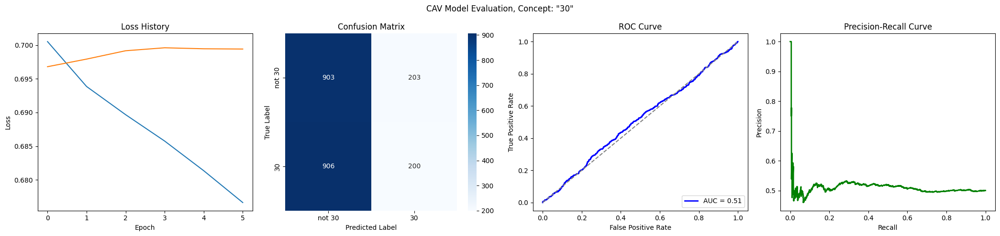

Training run 47/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6591
Epoch 11 Validation Loss: 0.6847
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6247
Epoch 21 Validation Loss: 0.6841
Early stopping at epoch 23
Loss history saved to trainings/singer_age_decade_30/loss_history.json


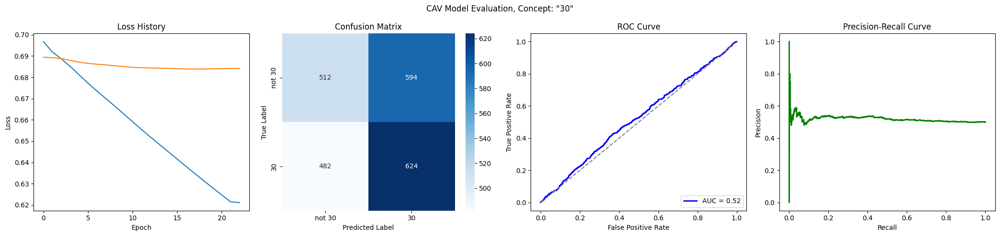

Training run 48/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6570
Epoch 11 Validation Loss: 0.6969
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_30/loss_history.json


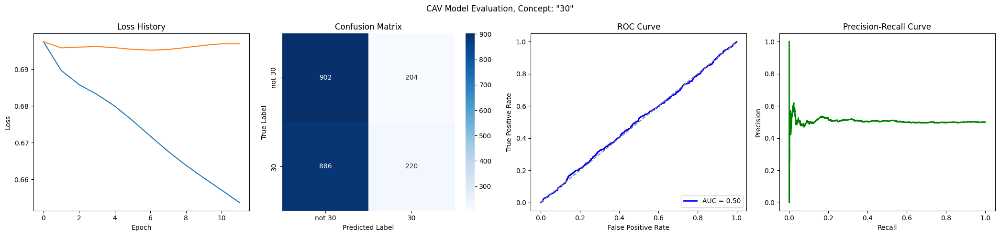

Training run 49/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6969
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6494
Epoch 11 Validation Loss: 0.6965
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_30/loss_history.json


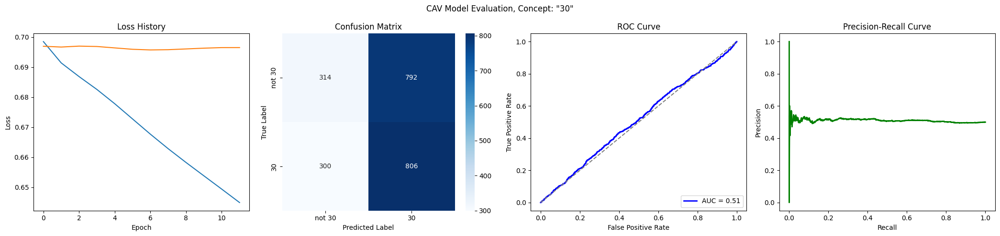

Training run 50/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6884
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


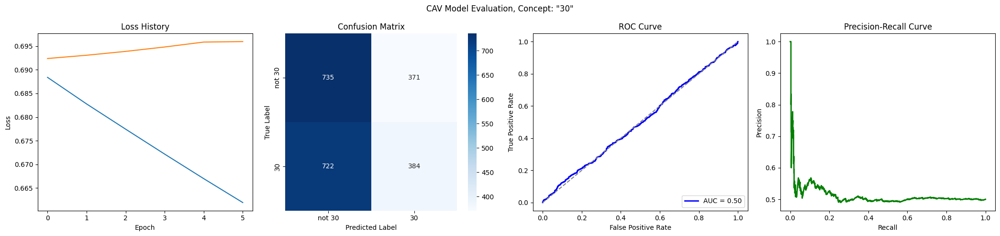

Training run 51/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


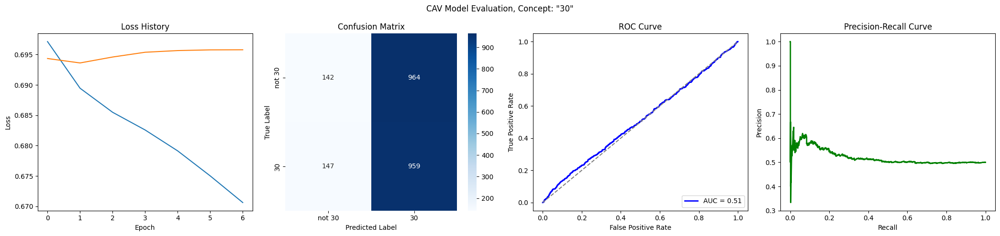

Training run 52/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6984
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


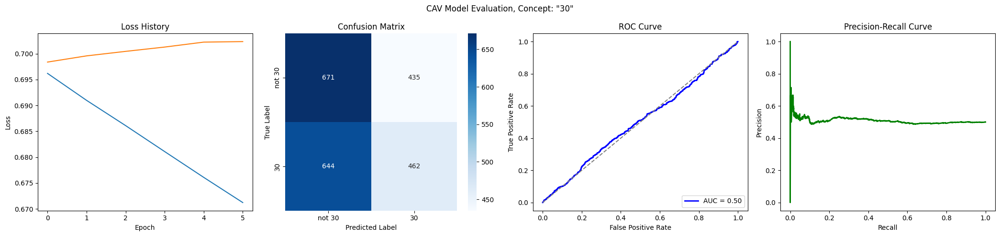

Training run 53/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6388
Epoch 11 Validation Loss: 0.6829
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5918
Epoch 21 Validation Loss: 0.6792
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_30/loss_history.json


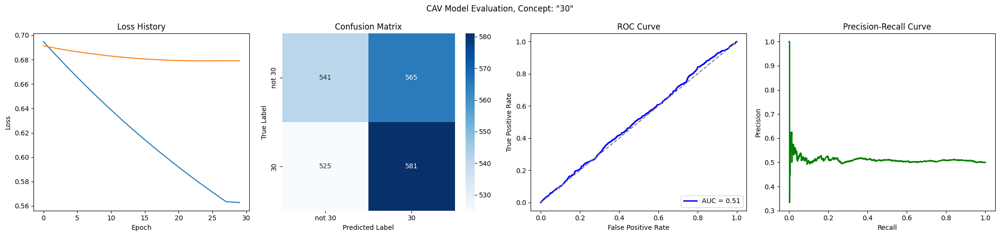

Training run 54/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6523
Epoch 11 Validation Loss: 0.6949
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_30/loss_history.json


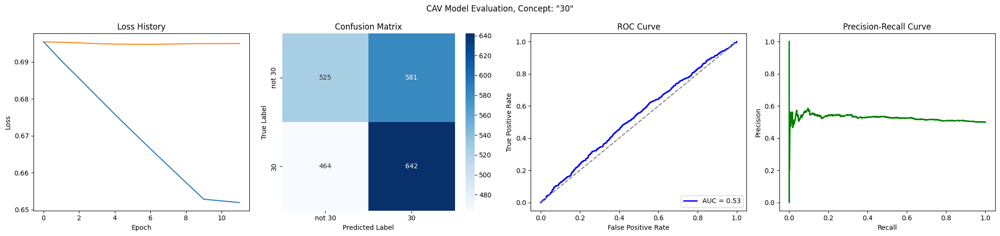

Training run 55/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6961
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


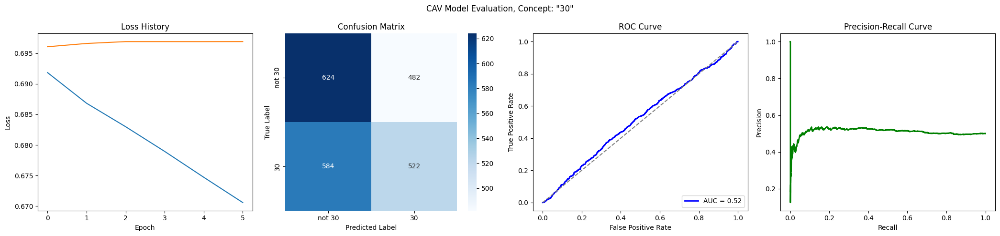

Training run 56/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6416
Epoch 11 Validation Loss: 0.6858
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5976
Epoch 21 Validation Loss: 0.6853
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_30/loss_history.json


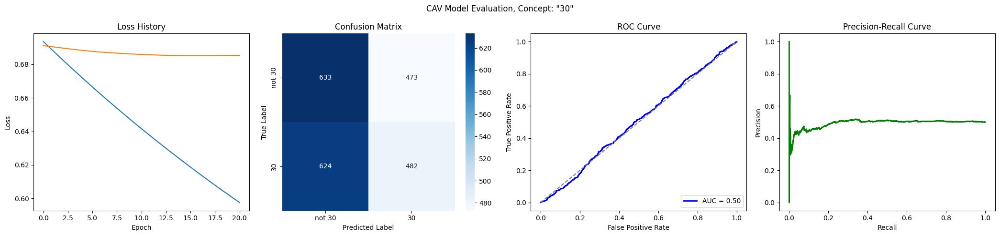

Training run 57/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6447
Epoch 11 Validation Loss: 0.6893
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_30/loss_history.json


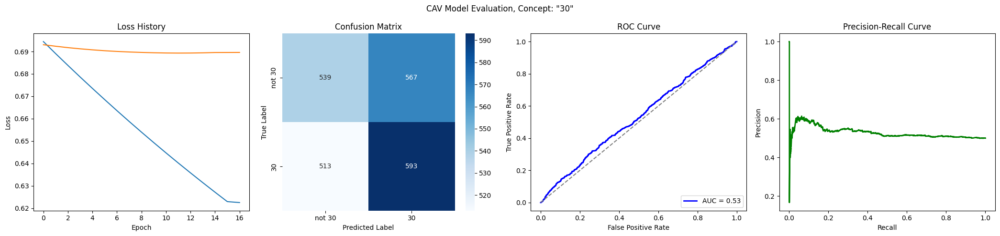

Training run 58/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


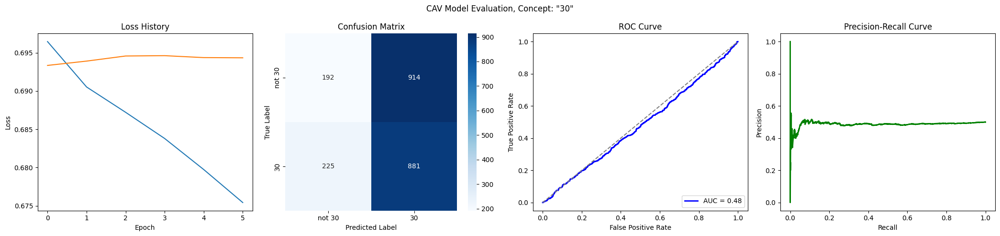

Training run 59/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


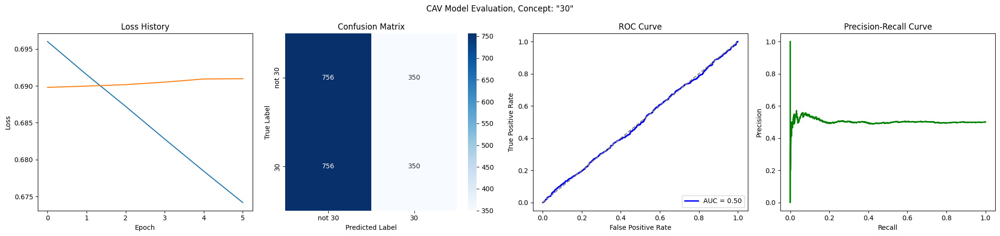

Training run 60/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6976
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


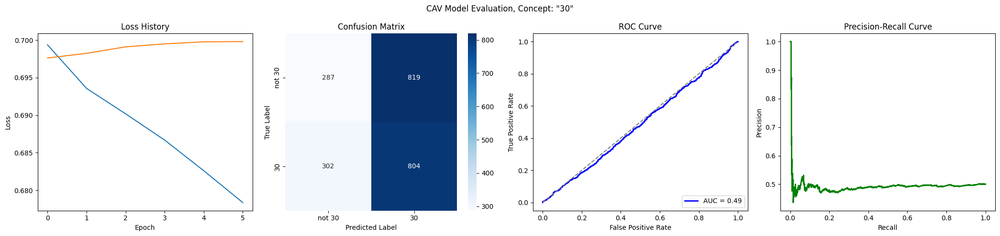

Training run 61/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6677
Epoch 11 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6630
Epoch 21 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6597
Epoch 31 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6597
Epoch 41 Validation Loss: 0.6918
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_30/loss_history.json


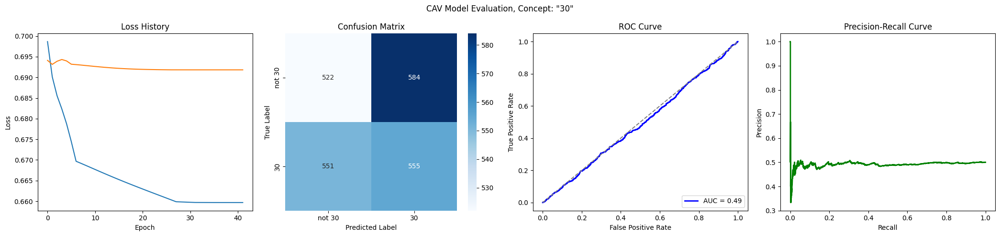

Training run 62/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6961
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


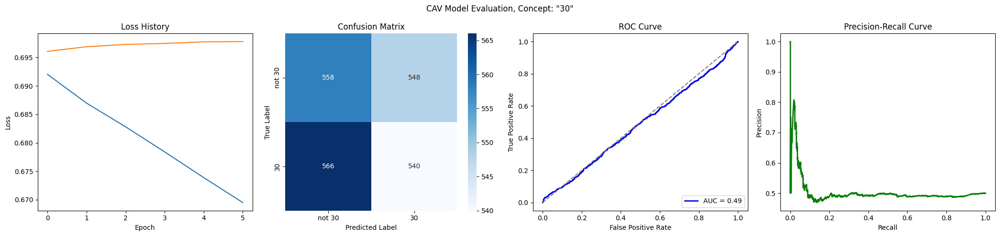

Training run 63/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7058
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


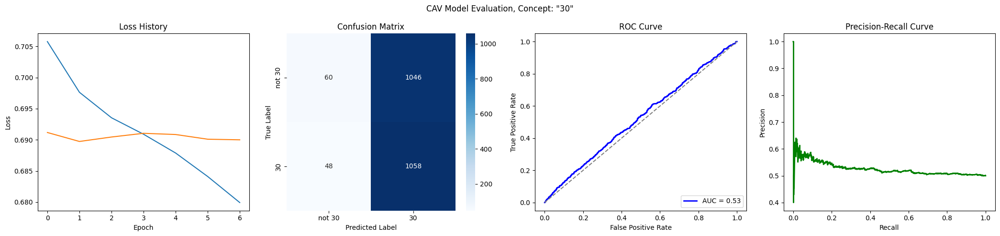

Training run 64/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6891
Epoch 1 Validation Loss: 0.6956
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6450
Epoch 11 Validation Loss: 0.6914
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 16
Loss history saved to trainings/singer_age_decade_30/loss_history.json


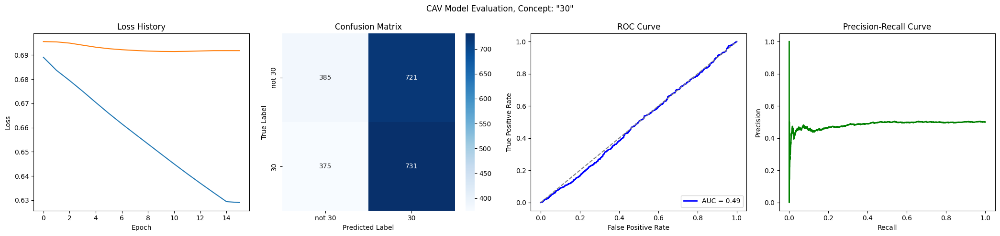

Training run 65/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6515
Epoch 11 Validation Loss: 0.6877
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6160
Epoch 21 Validation Loss: 0.6860
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5847
Epoch 31 Validation Loss: 0.6844
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5567
Epoch 41 Validation Loss: 0.6835
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5452
Epoch 51 Validation Loss: 0.6835
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/singer_age_decade_30/loss_history.json


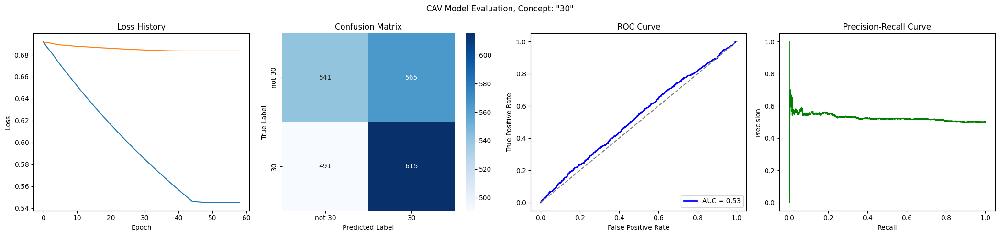

Training run 66/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


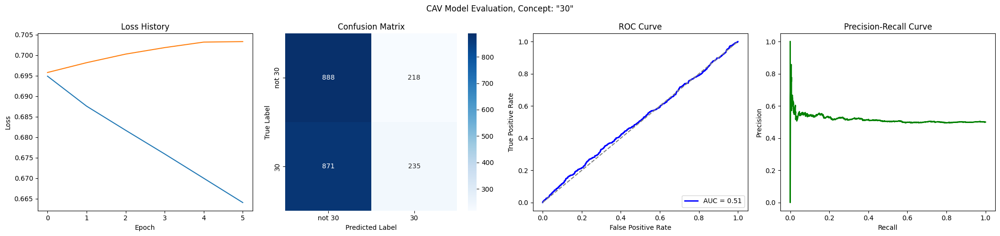

Training run 67/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7024
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


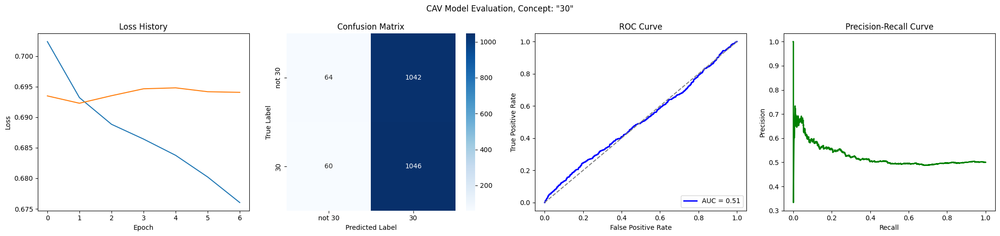

Training run 68/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6893
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6877
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_30/loss_history.json


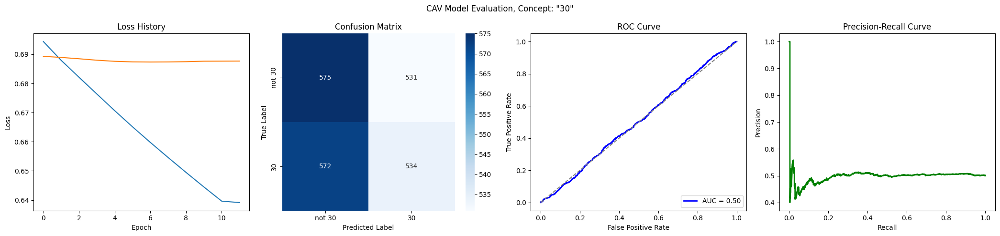

Training run 69/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


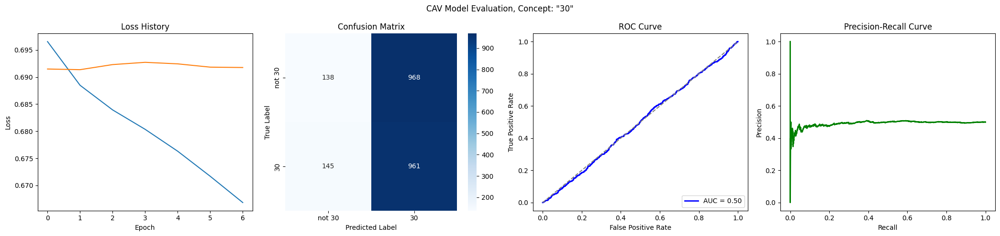

Training run 70/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


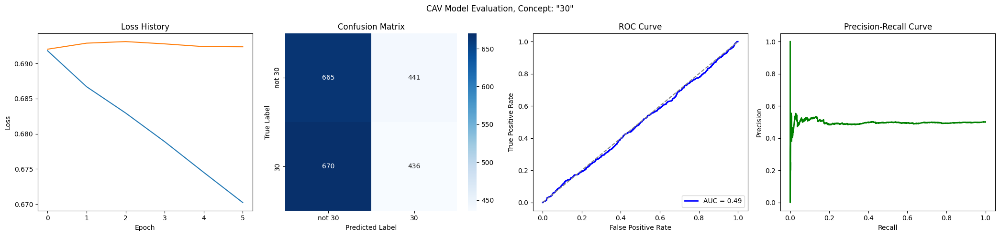

Training run 71/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7012
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6592
Epoch 11 Validation Loss: 0.6814
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6271
Epoch 21 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6212
Epoch 31 Validation Loss: 0.6784
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6180
Epoch 41 Validation Loss: 0.6778
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.6150
Epoch 51 Validation Loss: 0.6776
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.6136
Epoch 61 Validation Loss: 0.6776
Early stopping at epoch 69
Loss history saved to trainings/singer_age_decade_30/loss_histor

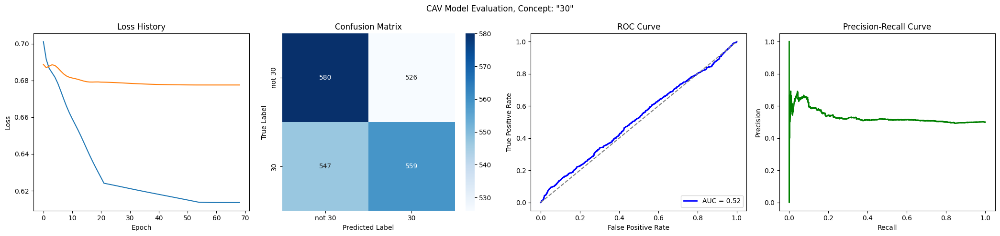

Training run 72/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6458
Epoch 11 Validation Loss: 0.6867
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_30/loss_history.json


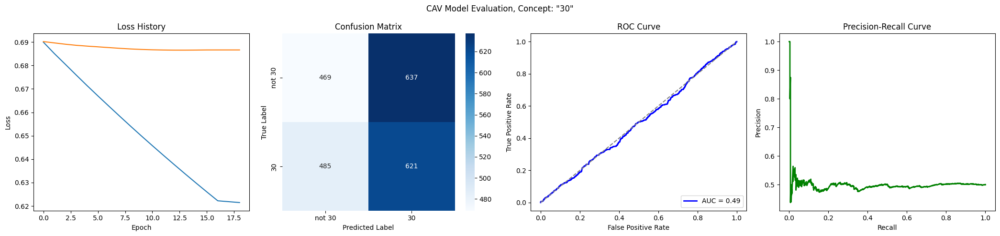

Training run 73/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7001
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


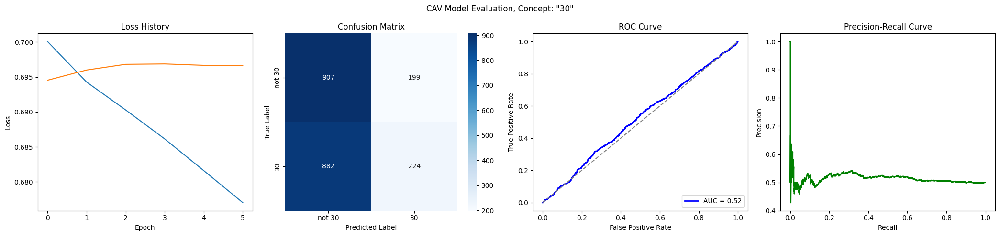

Training run 74/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


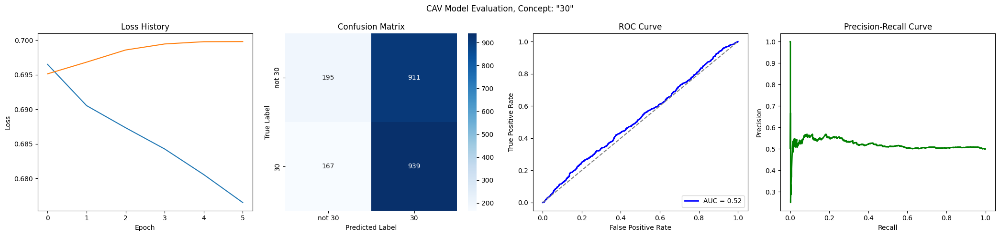

Training run 75/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6957
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6527
Epoch 11 Validation Loss: 0.6932
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_30/loss_history.json


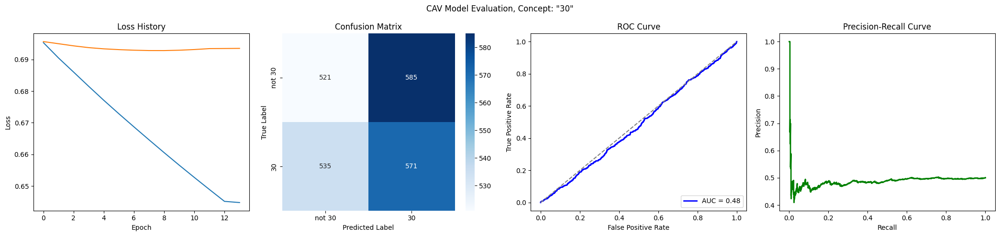

Training run 76/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6525
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6158
Epoch 21 Validation Loss: 0.6751
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5834
Epoch 31 Validation Loss: 0.6721
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5538
Epoch 41 Validation Loss: 0.6708
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_30/loss_history.json


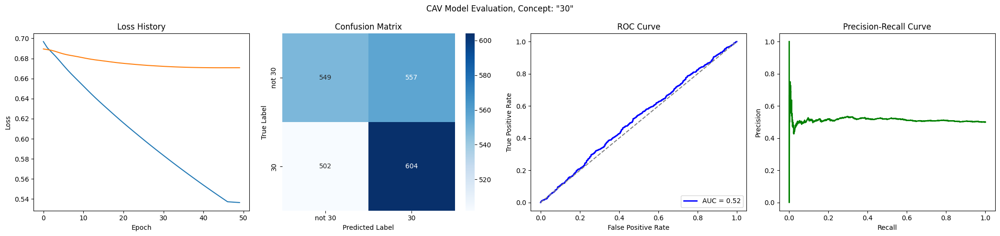

Training run 77/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


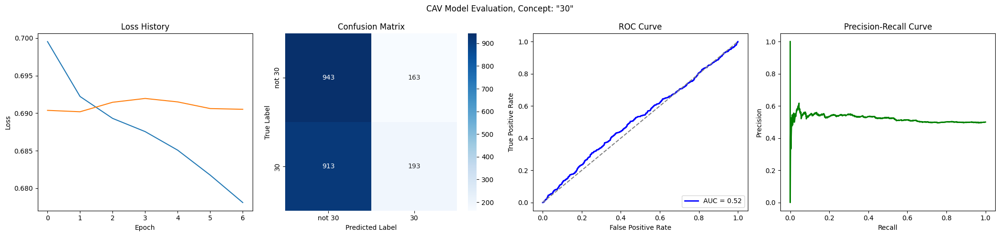

Training run 78/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6618
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_30/loss_history.json


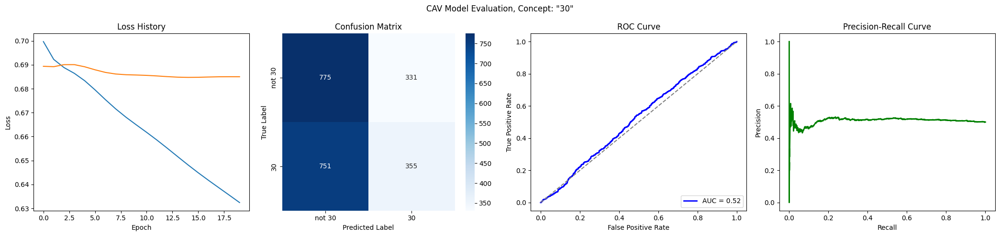

Training run 79/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


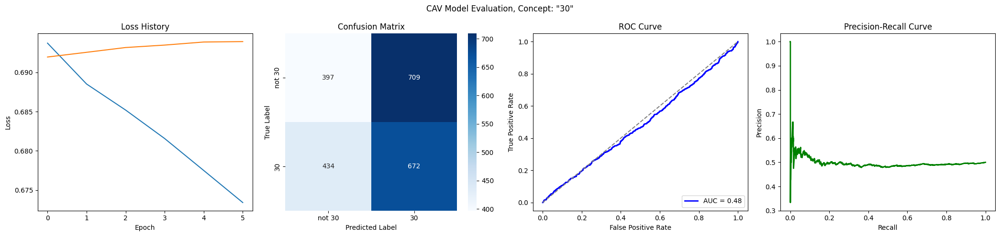

Training run 80/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


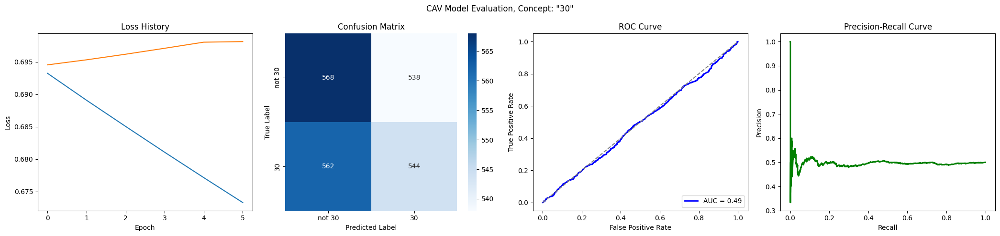

Training run 81/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6616
Epoch 11 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6274
Epoch 21 Validation Loss: 0.6869
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5966
Epoch 31 Validation Loss: 0.6851
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5686
Epoch 41 Validation Loss: 0.6846
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_30/loss_history.json


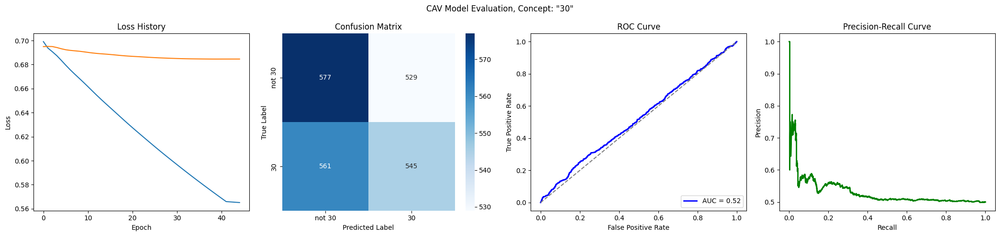

Training run 82/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


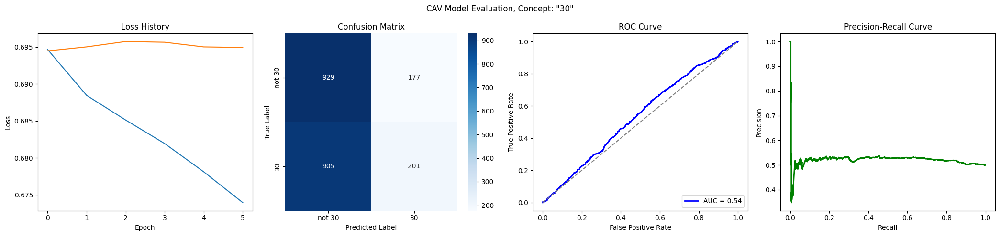

Training run 83/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6906
Epoch 1 Validation Loss: 0.6993
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


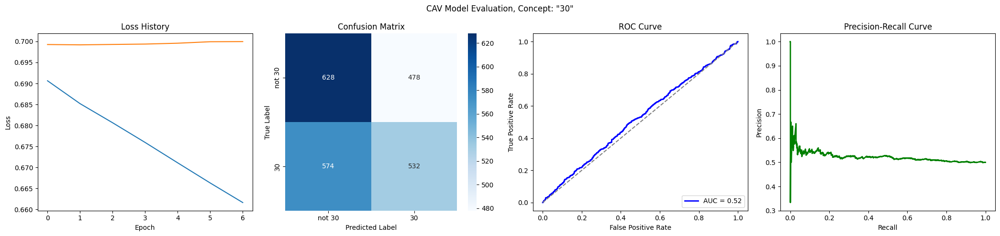

Training run 84/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6522
Epoch 11 Validation Loss: 0.6837
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6136
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5863
Epoch 31 Validation Loss: 0.6800
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5846
Epoch 41 Validation Loss: 0.6800
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5845
Epoch 51 Validation Loss: 0.6800
Early stopping at epoch 51
Loss history saved to trainings/singer_age_decade_30/loss_history.json


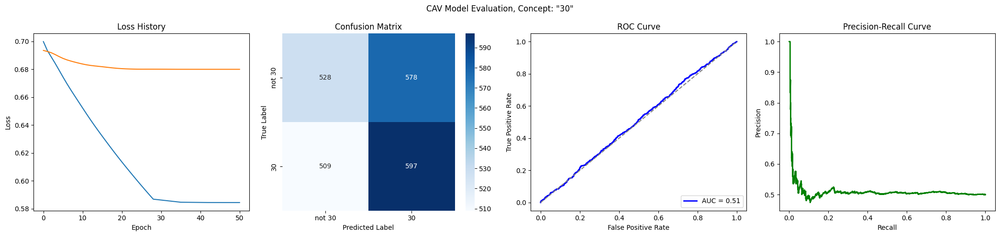

Training run 85/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


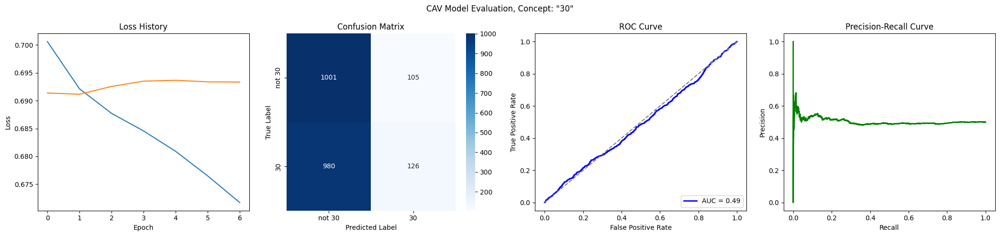

Training run 86/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6501
Epoch 11 Validation Loss: 0.6863
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6123
Epoch 21 Validation Loss: 0.6828
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5792
Epoch 31 Validation Loss: 0.6823
Early stopping at epoch 34
Loss history saved to trainings/singer_age_decade_30/loss_history.json


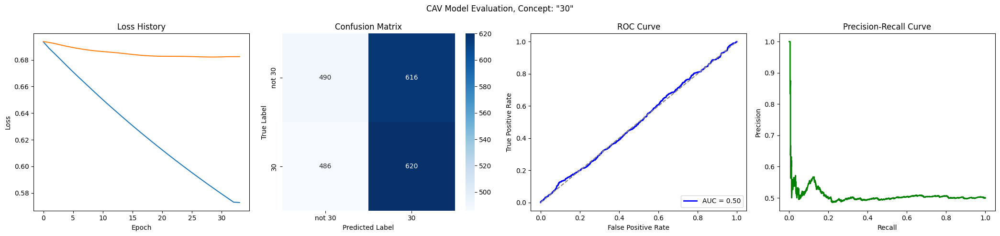

Training run 87/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


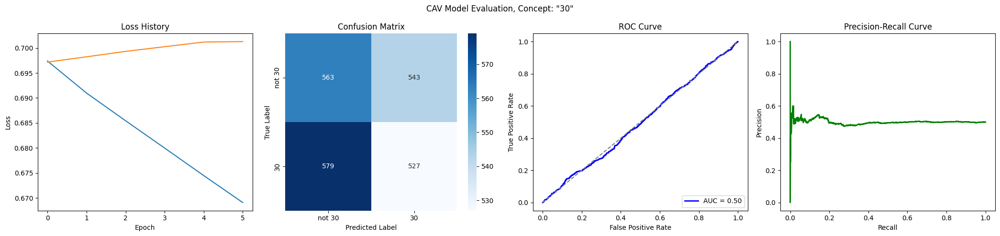

Training run 88/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6988
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


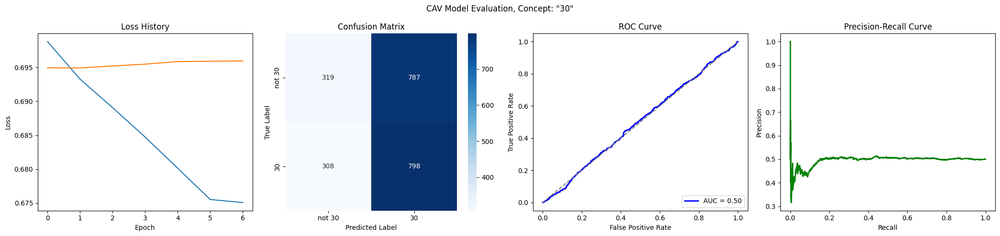

Training run 89/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6400
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5936
Epoch 21 Validation Loss: 0.6827
Early stopping at epoch 23
Loss history saved to trainings/singer_age_decade_30/loss_history.json


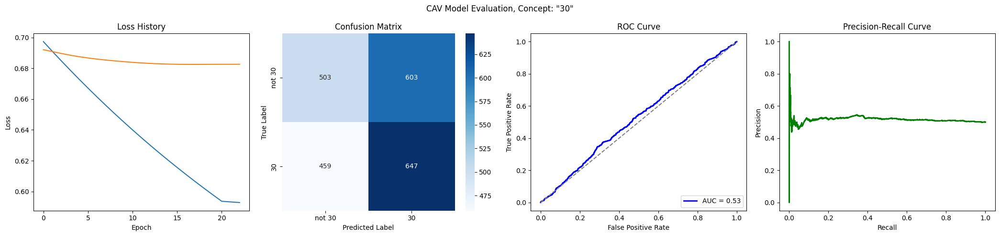

Training run 90/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6984
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_30/loss_history.json


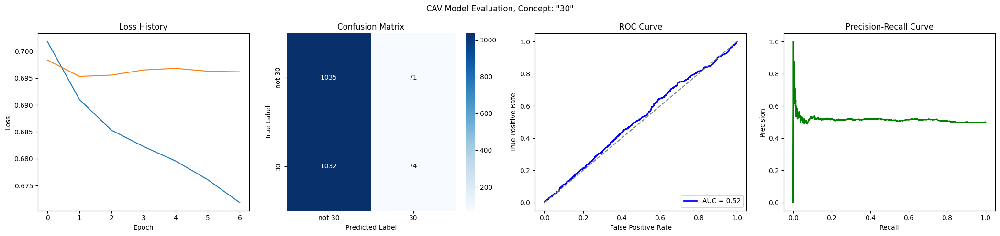

Training run 91/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7030
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6496
Epoch 11 Validation Loss: 0.6942
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_30/loss_history.json


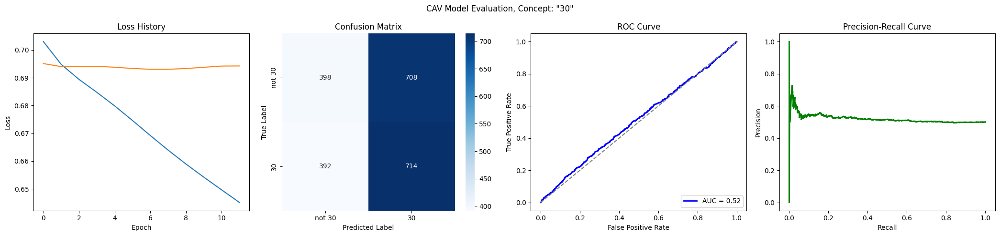

Training run 92/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


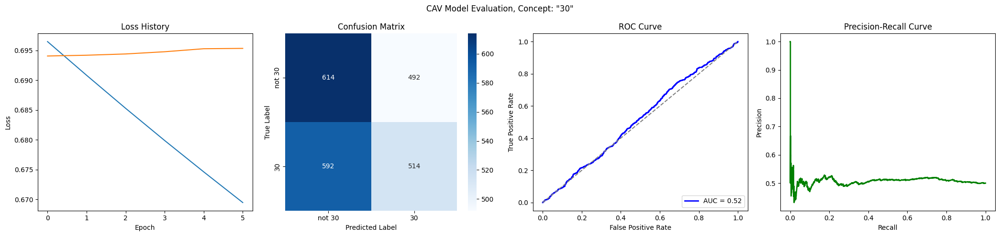

Training run 93/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7010
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


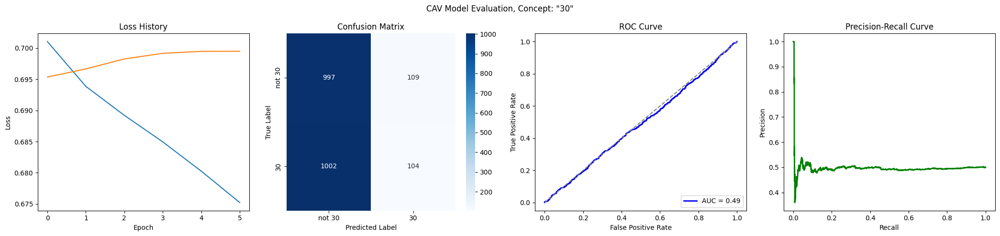

Training run 94/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/singer_age_decade_30/loss_history.json


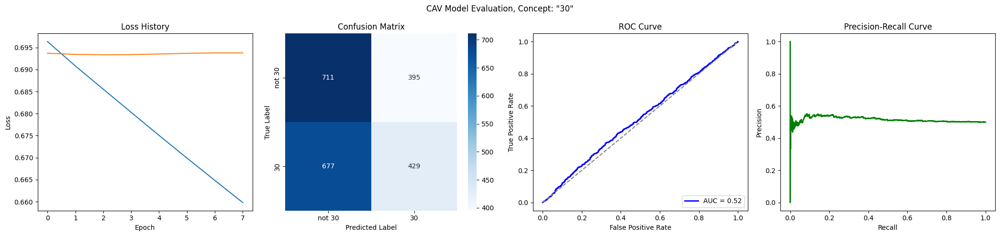

Training run 95/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


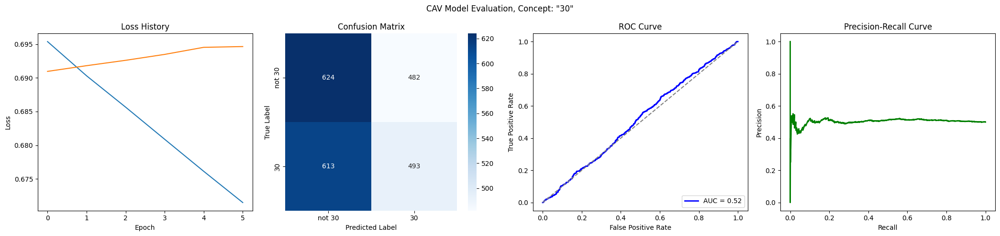

Training run 96/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6983
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6488
Epoch 11 Validation Loss: 0.6952
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_30/loss_history.json


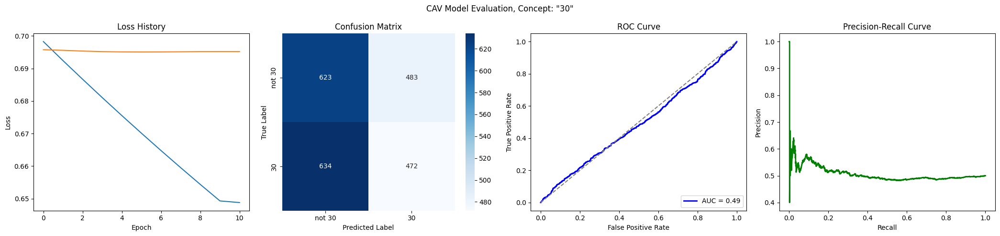

Training run 97/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6512
Epoch 11 Validation Loss: 0.6802
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6123
Epoch 21 Validation Loss: 0.6756
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5777
Epoch 31 Validation Loss: 0.6749
Early stopping at epoch 32
Loss history saved to trainings/singer_age_decade_30/loss_history.json


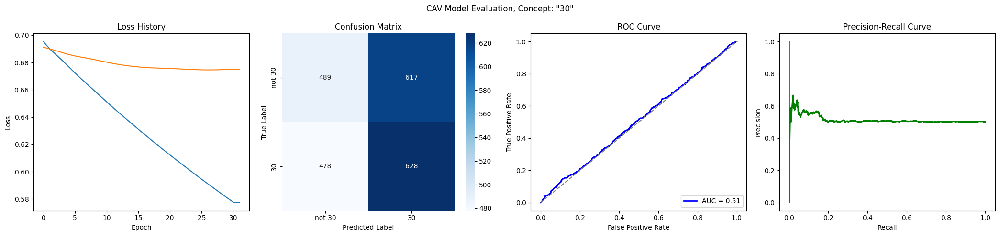

Training run 98/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7021
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


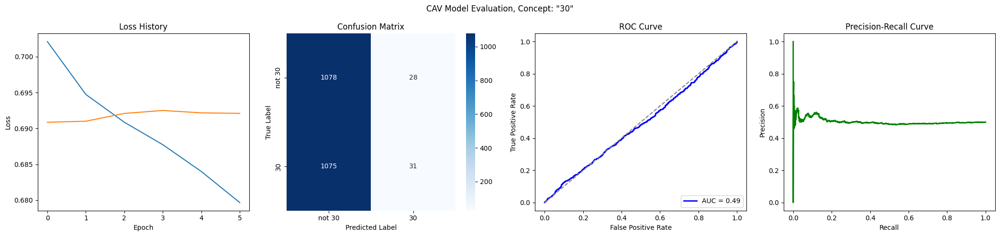

Training run 99/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6829
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6120
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5800
Epoch 31 Validation Loss: 0.6794
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5515
Epoch 41 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_30/loss_history.json


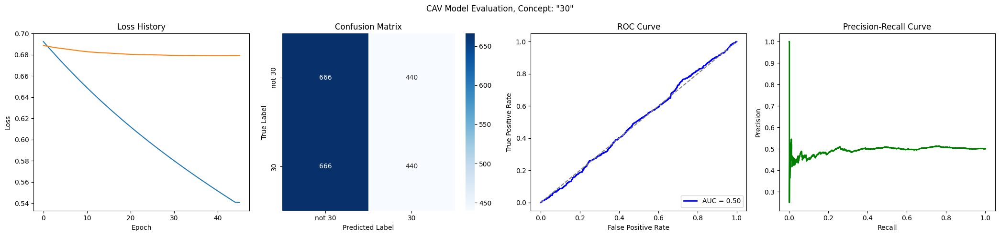

Training run 100/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/singer_age_decade_30/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_30/loss_history.json


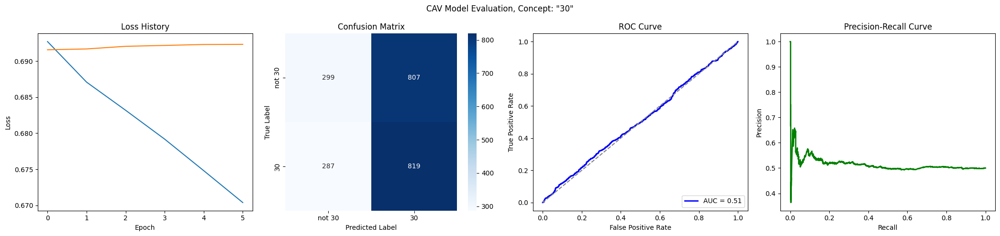

CPU times: user 4min 37s, sys: 1min 35s, total: 6min 13s
Wall time: 18min 30s


In [7]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [8]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [9]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [10]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [11]:
validation_sample_count

537

In [12]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)


4833 537
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6983
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6680
Epoch 11 Validation Loss: 0.6871
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6578
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6513
Epoch 31 Validation Loss: 0.6763
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6465
Epoch 41 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.6427
Epoch 51 Validation Loss: 0.6720
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.6395
Epoch 61 Validation Loss: 0.6709
Model saved to trainings/singer_age_decade_30/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.6367
Epoch 71